In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/test-img/test.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/results.csv
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2715746315.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3463034205.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/268704620.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/2673564214.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/7535037918.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4912369161.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/4828071602.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/6802728196.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3346289227.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/3217056901.jpg
/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_ima

1

In [2]:
!pip install transformers accelerate timm sentencepiece --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 28.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 73.7 MB/s eta 0:00:00


2

In [3]:
import pandas as pd
import os

df = pd.read_csv(
    "/kaggle/input/flickr-image-dataset/flickr30k_images/results.csv",
    sep="|",
    engine="python",
    quotechar='"',
    on_bad_lines='skip'
)

# Cột 0 = image, Cột 2 = caption
df = df.iloc[:, [0, 2]]
df.columns = ["image", "caption"]
df.dropna(inplace=True)
df = df[df["caption"].str.strip() != ""]
df = df.sample(frac=1).reset_index(drop=True)  # Shuffle
print("Tổng caption:", len(df))  # ~158k


Tổng caption: 158914


3

In [4]:
num_parts = 10
chunk_size = len(df) // num_parts
os.makedirs("splits", exist_ok=True)

for i in range(num_parts):
    start = i * chunk_size
    end = None if i == num_parts - 1 else (i + 1) * chunk_size
    df_part = df.iloc[start:end]
    df_part.to_csv(f"splits/train_part_{i}.csv", index=False)


4

In [5]:
from torch.utils.data import Dataset
from PIL import Image

class Flickr30kDataset(Dataset):
    def __init__(self, csv_file, image_dir, processor):
        self.data = pd.read_csv(csv_file)
        self.image_dir = image_dir
        self.processor = processor

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data.iloc[idx]
        image_path = os.path.join(self.image_dir, item["image"])
        caption = item["caption"]

        image = Image.open(image_path).convert("RGB")
        encoding = self.processor(images=image, text=caption, return_tensors="pt",
                                  padding="max_length", truncation=True, max_length=64)
        return {k: v.squeeze() for k, v in encoding.items()}


5

In [6]:
from transformers import BlipProcessor, BlipForConditionalGeneration
from torch.optim import AdamW
import torch
from torch.utils.data import DataLoader
from tqdm import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base").to(device)
optimizer = AdamW(model.parameters(), lr=5e-5)


2025-05-14 17:19:01.013021: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1747243141.193143      19 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1747243141.245581      19 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


preprocessor_config.json:   0%|          | 0.00/287 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/506 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/990M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/990M [00:00<?, ?B/s]

6

In [7]:
img_dir = "/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images"
batch_size = 4
epoch_per_part = 1

for i in range(num_parts):
    print(f"\n🔁 Huấn luyện phần {i}")
    dataset = Flickr30kDataset(f"splits/train_part_{i}.csv", img_dir, processor)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=2)

    model.train()
    for epoch in range(epoch_per_part):
        loop = tqdm(dataloader)
        for batch in loop:
            input_ids = batch["input_ids"].to(device)
            attention_mask = batch["attention_mask"].to(device)
            pixel_values = batch["pixel_values"].to(device)
            labels = input_ids.clone()

            outputs = model(pixel_values=pixel_values,
                            input_ids=input_ids,
                            attention_mask=attention_mask,
                            labels=labels)

            loss = outputs.loss
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()

            loop.set_description(f"Part {i}")
            loop.set_postfix(loss=loss.item())

    # Lưu
    path = f"/kaggle/working/blip-finetuned-part{i}"
    model.save_pretrained(path)
    processor.save_pretrained(path)
    print(f"✅ Đã lưu tại: {path}")



🔁 Huấn luyện phần 0



Part 0: 100%|██████████| 3973/3973 [26:19<00:00,  2.51it/s, loss=0.667]


✅ Đã lưu tại: /kaggle/working/blip-finetuned-part0

🔁 Huấn luyện phần 1


Part 1: 100%|██████████| 3973/3973 [26:10<00:00,  2.53it/s, loss=1.29]


✅ Đã lưu tại: /kaggle/working/blip-finetuned-part1

🔁 Huấn luyện phần 2


Part 2: 100%|██████████| 3973/3973 [26:09<00:00,  2.53it/s, loss=0.775]


✅ Đã lưu tại: /kaggle/working/blip-finetuned-part2

🔁 Huấn luyện phần 3


Part 3: 100%|██████████| 3973/3973 [26:09<00:00,  2.53it/s, loss=0.695]


✅ Đã lưu tại: /kaggle/working/blip-finetuned-part3

🔁 Huấn luyện phần 4


Part 4: 100%|██████████| 3973/3973 [26:11<00:00,  2.53it/s, loss=0.343]


✅ Đã lưu tại: /kaggle/working/blip-finetuned-part4

🔁 Huấn luyện phần 5


Part 5: 100%|██████████| 3973/3973 [26:11<00:00,  2.53it/s, loss=0.676]


✅ Đã lưu tại: /kaggle/working/blip-finetuned-part5

🔁 Huấn luyện phần 6


Part 6: 100%|██████████| 3973/3973 [26:11<00:00,  2.53it/s, loss=0.665]


✅ Đã lưu tại: /kaggle/working/blip-finetuned-part6

🔁 Huấn luyện phần 7


Part 7: 100%|██████████| 3973/3973 [26:12<00:00,  2.53it/s, loss=0.678]


✅ Đã lưu tại: /kaggle/working/blip-finetuned-part7

🔁 Huấn luyện phần 8


Part 8: 100%|██████████| 3973/3973 [26:12<00:00,  2.53it/s, loss=0.448]


✅ Đã lưu tại: /kaggle/working/blip-finetuned-part8

🔁 Huấn luyện phần 9


Part 9: 100%|██████████| 3974/3974 [26:12<00:00,  2.53it/s, loss=0.387]


✅ Đã lưu tại: /kaggle/working/blip-finetuned-part9


7

In [8]:
processor = BlipProcessor.from_pretrained("/kaggle/working/blip-finetuned-part5")
model = BlipForConditionalGeneration.from_pretrained("/kaggle/working/blip-finetuned-part5").to(device)
optimizer = AdamW(model.parameters(), lr=5e-5)

for i in range(6, 10):
    print(f"\n⏩ Tiếp tục huấn luyện phần {i}")
    dataset = Flickr30kDataset(f"splits/train_part_{i}.csv", img_dir, processor)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=2)

    model.train()
    for epoch in range(1):
        loop = tqdm(dataloader)
        for batch in loop:
            input_ids = batch["input_ids"].to(device)
            attention_mask = batch["attention_mask"].to(device)
            pixel_values = batch["pixel_values"].to(device)
            labels = input_ids.clone()

            outputs = model(pixel_values=pixel_values,
                            input_ids=input_ids,
                            attention_mask=attention_mask,
                            labels=labels)

            loss = outputs.loss
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()

            loop.set_description(f"Part {i}")
            loop.set_postfix(loss=loss.item())

    model.save_pretrained(f"/kaggle/working/blip-finetuned-part{i}")



⏩ Tiếp tục huấn luyện phần 6


Part 6: 100%|██████████| 3973/3973 [26:13<00:00,  2.52it/s, loss=0.519]



⏩ Tiếp tục huấn luyện phần 7


Part 7: 100%|██████████| 3973/3973 [26:12<00:00,  2.53it/s, loss=0.717]



⏩ Tiếp tục huấn luyện phần 8


Part 8: 100%|██████████| 3973/3973 [26:11<00:00,  2.53it/s, loss=0.258]



⏩ Tiếp tục huấn luyện phần 9


Part 9: 100%|██████████| 3974/3974 [26:13<00:00,  2.53it/s, loss=0.572]


8

In [9]:
def caption_image(img_path):
    model.eval()
    image = Image.open(img_path).convert("RGB")
    inputs = processor(image, return_tensors="pt").to(device)
    with torch.no_grad():
        out = model.generate(**inputs, max_new_tokens=20)
    return processor.decode(out[0], skip_special_tokens=True)

# 🧪 Caption thử
print(caption_image("/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/1000092795.jpg"))


a man in a green shirt is standing in front of a tree.


9

In [10]:
!pip install evaluate --quiet


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.0/84.0 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.6/193.6 kB 10.0 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cesium 0.12.4 requires numpy<3.0,>=2.0, but you have numpy 1.26.4 which is incompatible.
bigframes 1.42.0 requires rich<14,>=12.4.4, but you have rich 14.0.0 which is incompatible.
gcsfs 2025.3.2 requires fsspec==2025.3.2, but you have fsspec 2025.3.0 which is incompatible.


In [11]:
import evaluate

bleu = evaluate.load("bleu")
df_eval = df.groupby("image").agg(list).reset_index().sample(n=500)

preds, refs = [], []

for _, row in df_eval.iterrows():
    image_path = os.path.join(img_dir, row["image"])
    prediction = caption_image(image_path)
    preds.append(prediction)
    refs.append([cap.strip() for cap in row["caption"]])

bleu_result = bleu.compute(predictions=preds, references=refs)
print("✅ BLEU score:", bleu_result["bleu"])


✅ BLEU score: 0.2895620210848703


In [12]:
import matplotlib.pyplot as plt
from PIL import Image


In [13]:
def caption_and_show(img_path, max_tokens=30, num_beams=5):
    model.eval()
    image = Image.open(img_path).convert("RGB")
    inputs = processor(image, return_tensors="pt").to(device)

    with torch.no_grad():
        out = model.generate(
            **inputs,
            max_new_tokens=max_tokens,
            num_beams=num_beams,
            early_stopping=True
        )

    caption = processor.decode(out[0], skip_special_tokens=True)

    # Hiển thị ảnh + caption
    plt.imshow(image)
    plt.axis("off")
    plt.title(caption, fontsize=12)
    plt.show()

    return caption


Ảnh 1: 3215117062.jpg


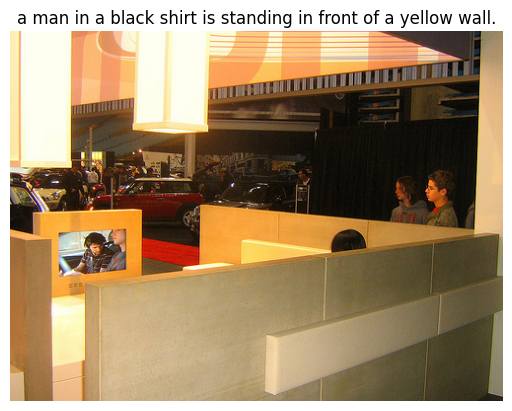

Ảnh 2: 7725130978.jpg


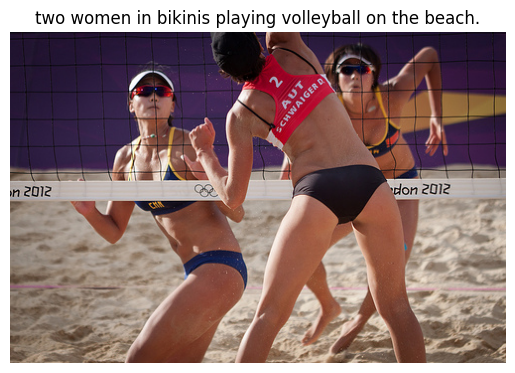

Ảnh 3: 3559357704.jpg


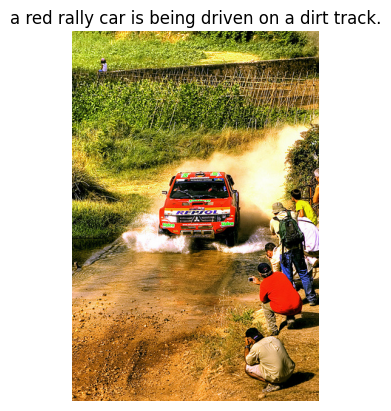

Ảnh 4: 2354540393.jpg


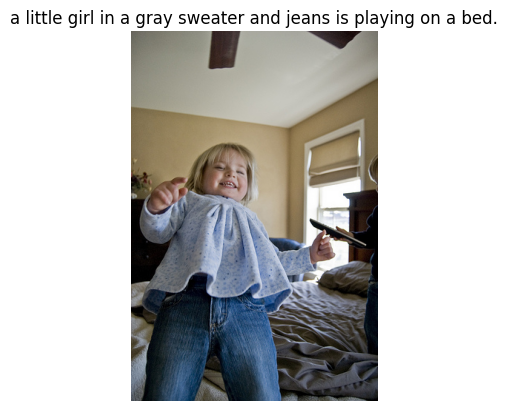

Ảnh 5: 4177309448.jpg


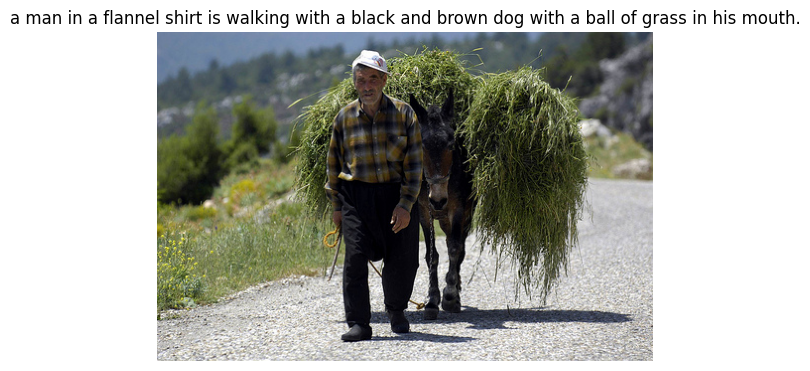

In [14]:
# Lấy 5 ảnh đầu tiên từ tập df_eval đã dùng đánh giá BLEU
for i in range(5):
    img_path = os.path.join(img_dir, df_eval.iloc[i]["image"])
    print(f"Ảnh {i+1}: {df_eval.iloc[i]['image']}")
    caption_and_show(img_path)


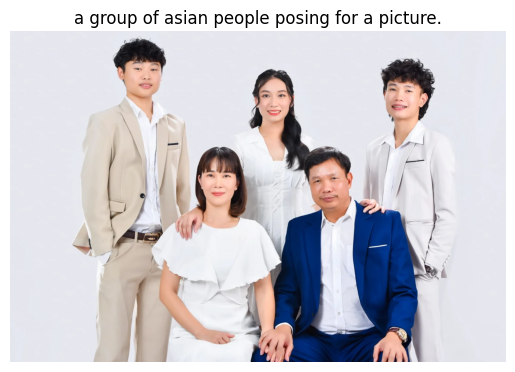

'a group of asian people posing for a picture.'

In [15]:
caption_and_show("/kaggle/input/test-img/test.jpg", max_tokens=30, num_beams=5)


In [16]:
model.save_pretrained("/kaggle/working/blip-finetuned-part9")
processor.save_pretrained("/kaggle/working/blip-finetuned-part9")


[]